<a href="https://colab.research.google.com/github/BimanTamoLabs/AudioMnist/blob/main/coffeebean.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from fastai.vision.all import *

In [2]:
import os

In [3]:
from fastcore.foundation import L
from fastcore.xtras import Path # @patch'd properties to the Pathlib module

from fastai.callback.fp16 import to_fp16
from fastai.callback.schedule import fit_one_cycle, lr_find 

from fastai.data.block import CategoryBlock, DataBlock
from fastai.data.transforms import get_image_files, Normalize, RandomSplitter, parent_label

from fastai.interpret import ClassificationInterpretation
from fastai.learner import Learner # imports @patch'd properties to Learner including `save`, `load`, `freeze`, and `unfreeze`

from fastai.vision.augment import aug_transforms, RandomResizedCrop
from fastai.vision.core import imagenet_stats
from fastai.vision.data import ImageBlock
from fastai.vision.learner import cnn_learner
from fastai.vision.utils import download_images, verify_images

In [4]:
!pip install opendatasets --upgrade --quiet

In [5]:
import opendatasets as od

In [6]:
dataset_url = 'https://www.kaggle.com/datasets/gpiosenka/coffee-bean-dataset-resized-224-x-224'

In [7]:
od.download(dataset_url)

100%|██████████| 144M/144M [00:01<00:00, 80.8MB/s]


In [8]:
data_dir = '/content/coffee-bean-dataset-resized-224-x-224'

In [9]:
os.listdir(data_dir)

['Coffee Bean.csv', 'test', 'train']

In [10]:
import pandas as pd

In [11]:
df = pd.read_csv('/content/coffee-bean-dataset-resized-224-x-224/Coffee Bean.csv')

In [12]:
df.head()

,class index,filepaths,labels,data set
0,0,train/Dark/dark (1).png,Dark,train
1,0,train/Dark/dark (10).png,Dark,train
2,0,train/Dark/dark (100).png,Dark,train
3,0,train/Dark/dark (101).png,Dark,train
4,0,train/Dark/dark (102).png,Dark,train


In [13]:
DATASET_PATH = Path('/content/coffee-bean-dataset-resized-224-x-224')

In [14]:
DATASET_PATH.ls()

(#3) [Path('/content/coffee-bean-dataset-resized-224-x-224/Coffee Bean.csv'),Path('/content/coffee-bean-dataset-resized-224-x-224/test'),Path('/content/coffee-bean-dataset-resized-224-x-224/train')]

In [15]:
cofeebean = DataBlock(blocks=(ImageBlock, CategoryBlock),
                      get_items=get_image_files,
                      splitter=GrandparentSplitter(train_name=('train'),valid_name='test'),
                      get_y=parent_label,
                      item_tfms=RandomResizedCrop(224),
                      batch_tfms=[*aug_transforms(size=224, max_warp=0), 
                              Normalize.from_stats(*imagenet_stats)])

In [16]:
dls = cofeebean.dataloaders(DATASET_PATH,  bs=32)

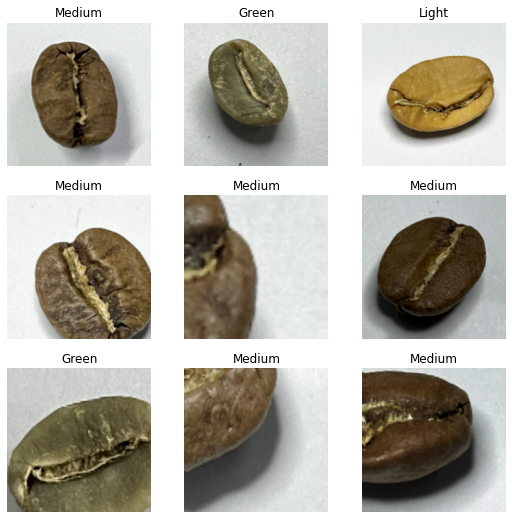

In [17]:
dls.show_batch(max_n=9)

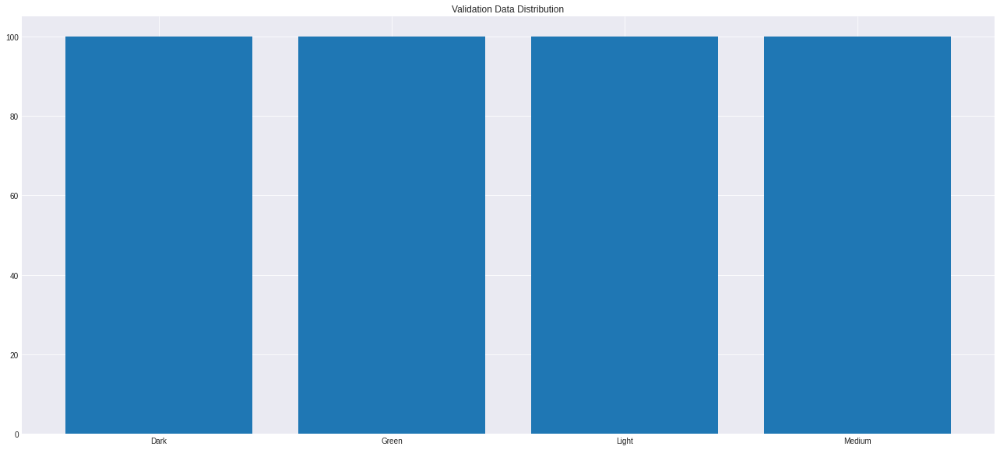

In [18]:
from collections import Counter

plt.style.use('seaborn-darkgrid')

def category_count(class_items, title):
    list_of_classes = [path.parts[-2] for path in class_items]
    d = dict(sorted(Counter(list_of_classes).items()))

    fig, ax = plt.subplots(figsize=(18,8))
    fig.tight_layout()

    plt.title(title)
    ax.bar(d.keys(), d.values())

category_count(dls.valid_ds.items, 'Validation Data Distribution')

In [19]:
dls.vocab

['Dark', 'Green', 'Light', 'Medium']

In [20]:
learn = cnn_learner(dls, resnet34, pretrained=True,metrics=accuracy).to_fp16()

/usr/local/lib/python3.7/dist-packages/fastai/vision/learner.py:284: UserWarning: `cnn_learner` has been renamed to `vision_learner` -- please update your code
  warn("`cnn_learner` has been renamed to `vision_learner` -- please update your code")
/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:209: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and will be removed in 0.15, please use 'weights' instead.
  f"The parameter '{pretrained_param}' is deprecated since 0.13 and will be removed in 0.15, "
/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=ResNet34_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet34_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet34-b627

  0%|          | 0.00/83.3M [00:00<?, ?B/s]

In [21]:
learn.fit_one_cycle(4)

epoch,train_loss,valid_loss,accuracy,time
0,1.136869,0.152705,0.955000,00:10
1,0.566092,0.050201,0.980000,00:06
2,0.355877,0.037330,0.992500,00:06
3,0.265484,0.027958,0.990000,00:07


In [22]:
interp = ClassificationInterpretation.from_learner(learn)
losses,idxs = interp.top_losses()

len(dls.valid_ds)==len(losses)==len(idxs)

True

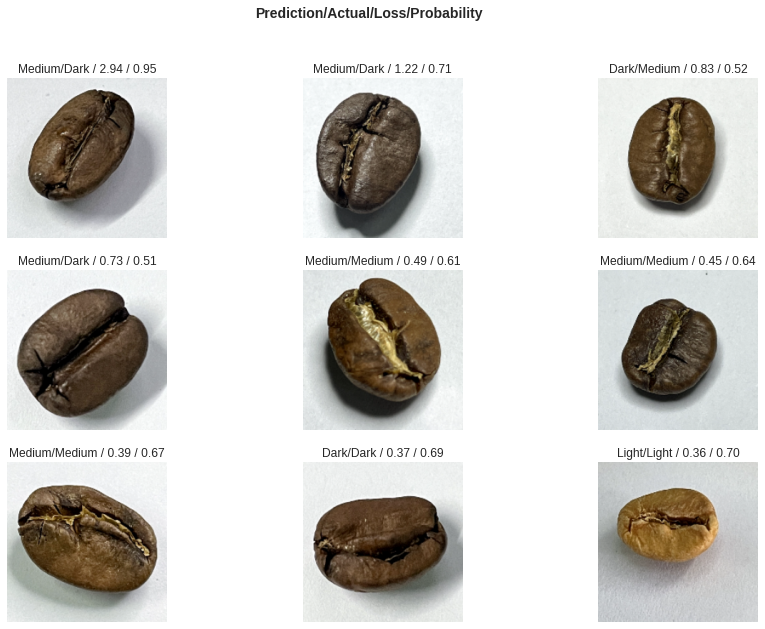

In [23]:
interp.plot_top_losses(9, figsize=(15,10))

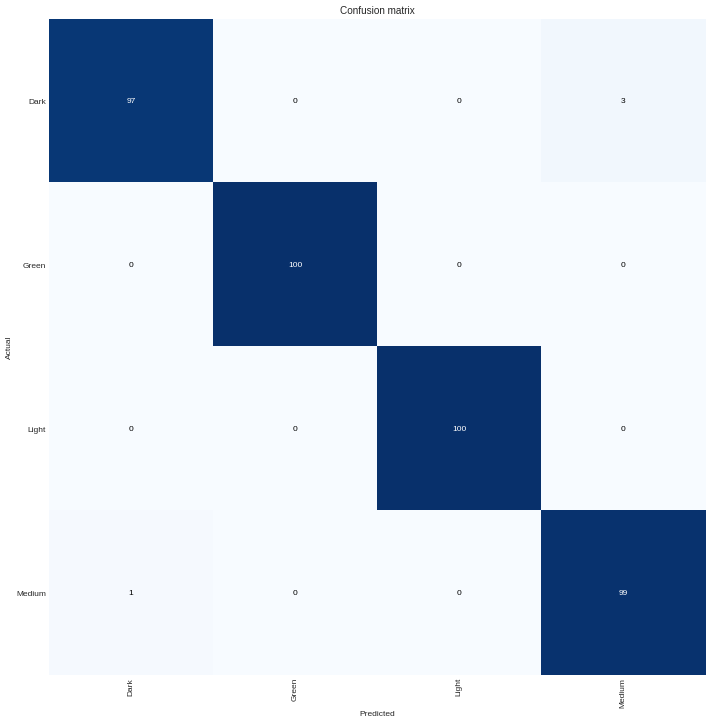

In [24]:
interp.plot_confusion_matrix(figsize=(12,12), dpi=60)

In [25]:
!pip install shap --quiet
import shap

     |████████████████████████████████| 569 kB 7.4 MB/s 


In [26]:
# pull a sample of our data (128 images)
batch = dls.one_batch()

# specify how many images to use when creating the background distribution
num_samples = 10
explainer = shap.GradientExplainer(
    learn.model, batch[0][:num_samples]
)

# calculate shapely values
shap_values = explainer.shap_values(
    batch[0][num_samples:]
)

In [27]:
img = batch[0]
img.shape

torch.Size([32, 3, 224, 224])

In [28]:
import matplotlib.pyplot as pl
%matplotlib inline

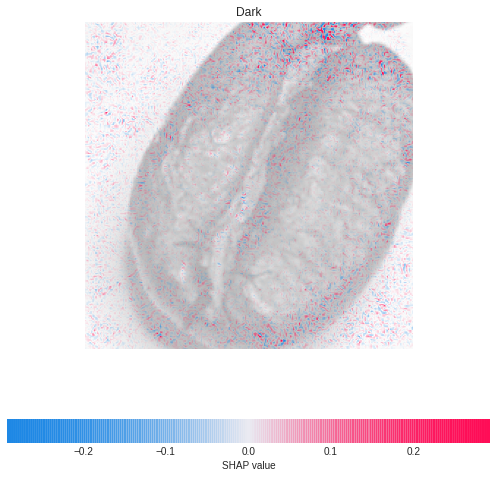

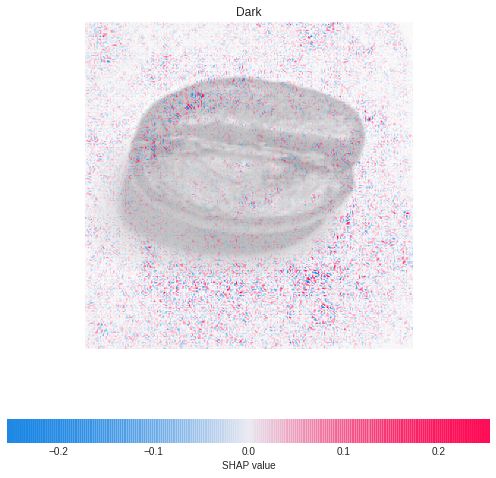

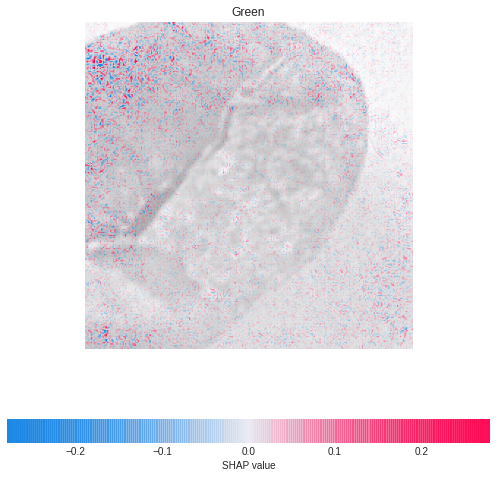

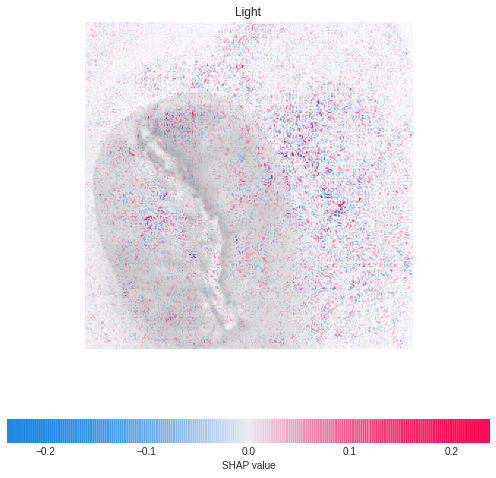

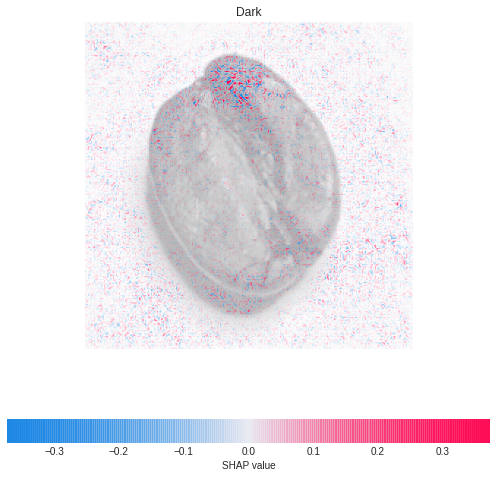

...

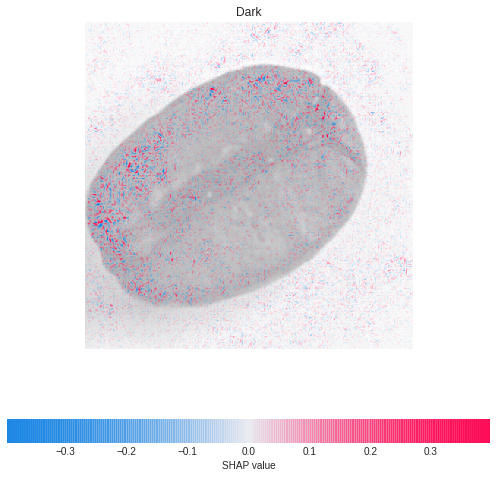

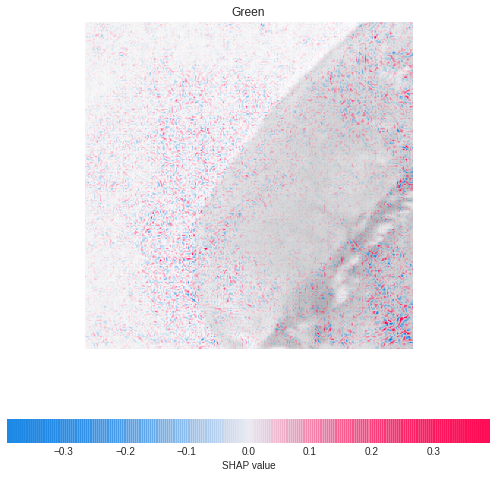

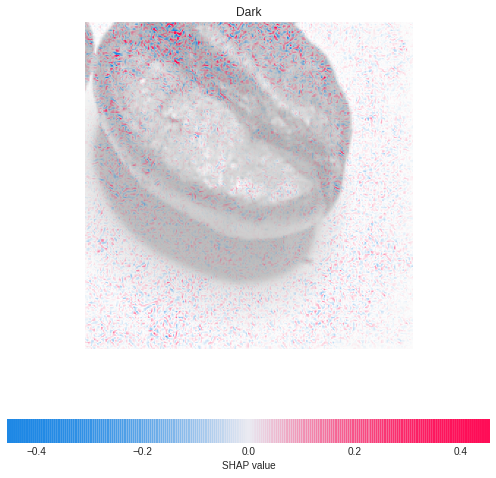

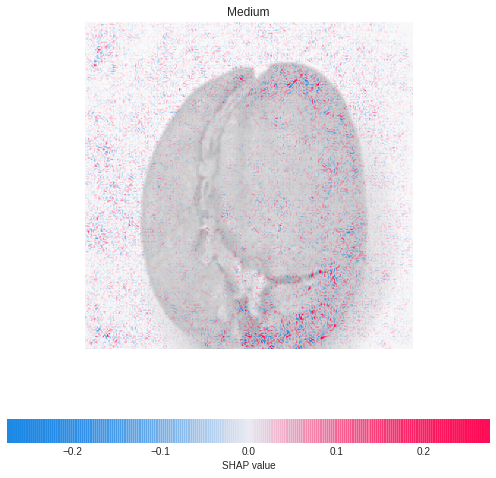

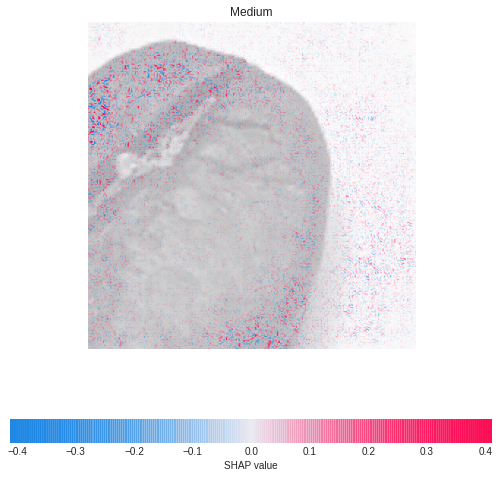

In [29]:
from shap.plots import colors

for idx, x in enumerate(batch[0][num_samples:]):
    x = x.cpu() # move image to CPU
    label = dls.train.vocab[batch[1][num_samples:]][idx]
    sv_idx = list(dls.train.vocab).index(label)

    # plot our explanations
    fig, axes = pl.subplots(figsize=(7, 7))

    # make sure we have a 2D array for grayscale
    if len(x.shape) == 3 and x.shape[2] == 1:
        x = x.reshape(x.shape[:2])
    if x.max() > 1:
        x /= 255.

    # get a grayscale version of the image
    x_curr_gray = (
        0.2989 * x[0,:,:] +
        0.5870 * x[1,:,:] +
        0.1140 * x[2,:,:]
    )
    x_curr_disp = x

    abs_vals = np.stack(
        [np.abs(shap_values[sv_idx][idx].sum(0))], 0
    ).flatten()
    max_val = np.nanpercentile(abs_vals, 99.9)

    label_kwargs = {'fontsize': 12}
    axes.set_title(label, **label_kwargs)

    sv = shap_values[sv_idx][idx].sum(0)
    axes.imshow(
        x_curr_gray,
        cmap=pl.get_cmap('gray'),
        alpha=0.3,
        extent=(-1, sv.shape[1], sv.shape[0], -1)
    )
    im = axes.imshow(
        sv,
        cmap=colors.red_transparent_blue, 
        vmin=-max_val, 
        vmax=max_val
    )
    axes.axis('off')

    fig.tight_layout()

    cb = fig.colorbar(
        im, 
        ax=np.ravel(axes).tolist(),
        label="SHAP value",
        orientation="horizontal"
    )
    cb.outline.set_visible(False)
    pl.show()

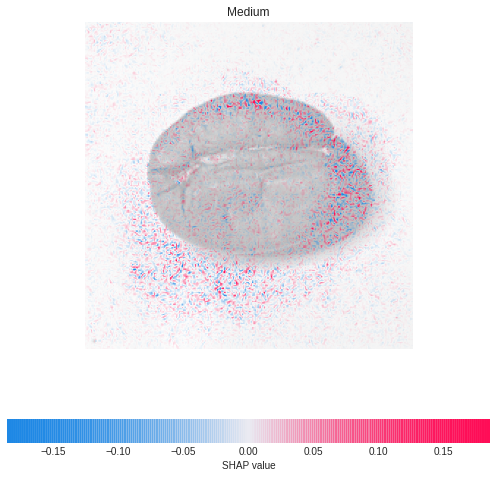

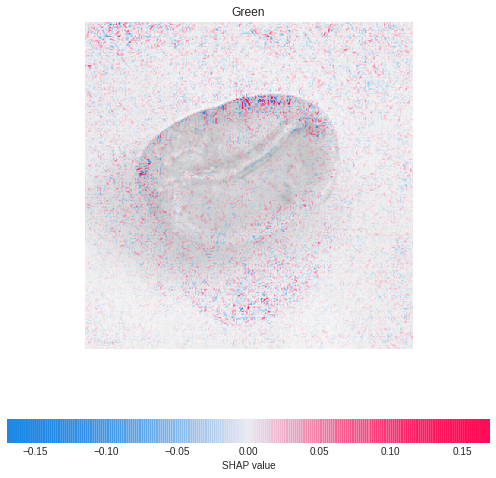

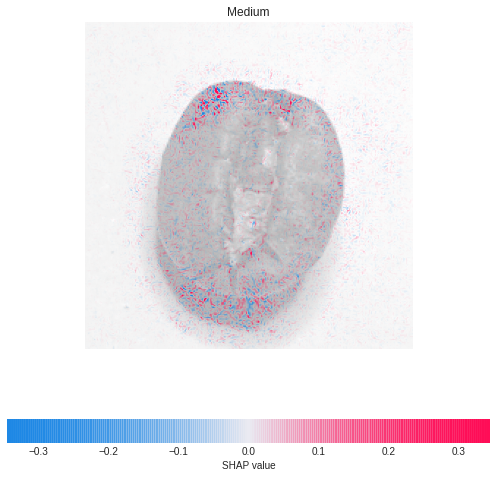

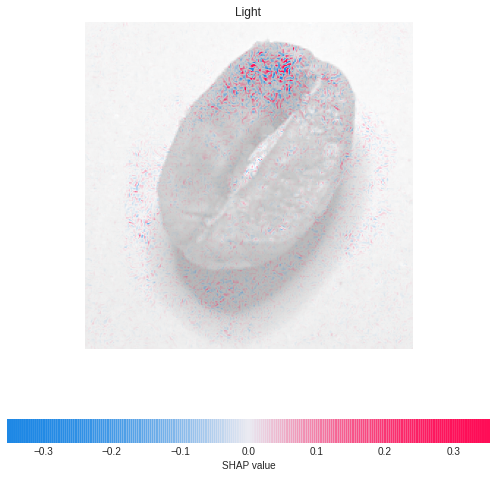

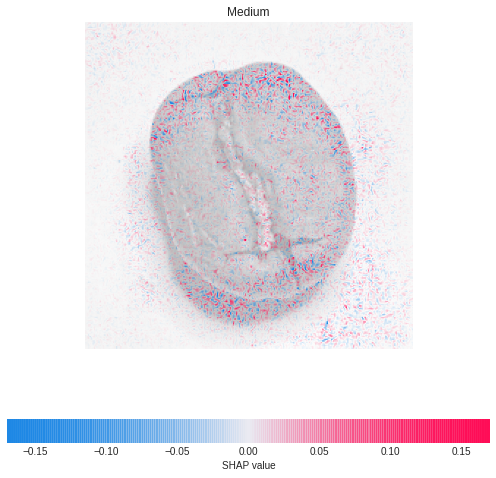

...

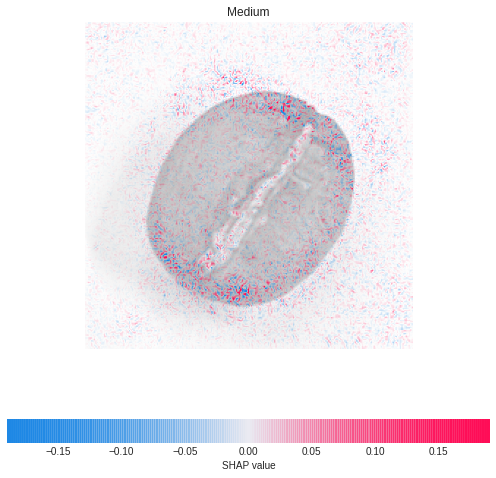

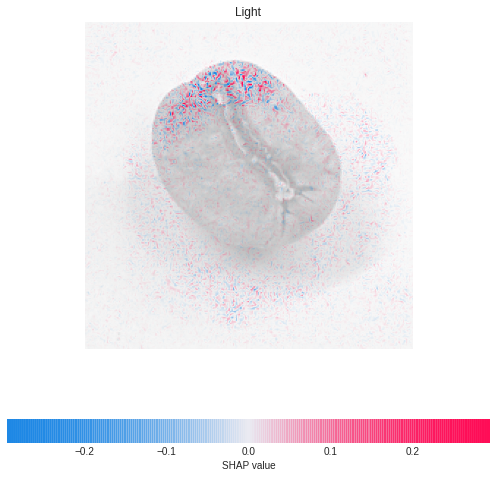

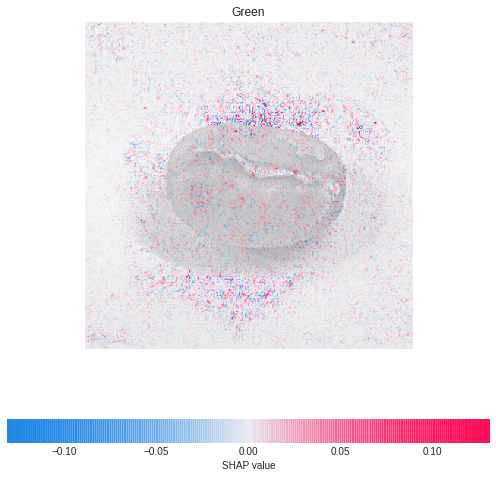

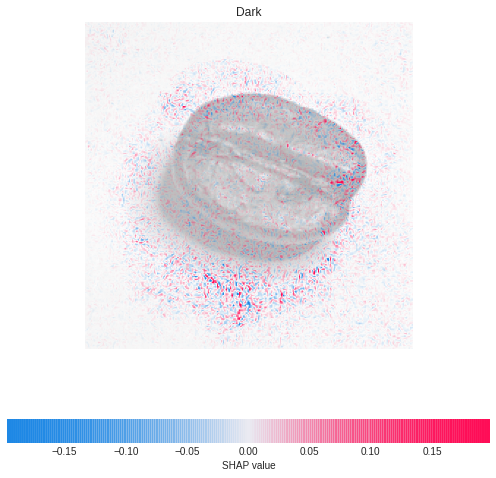

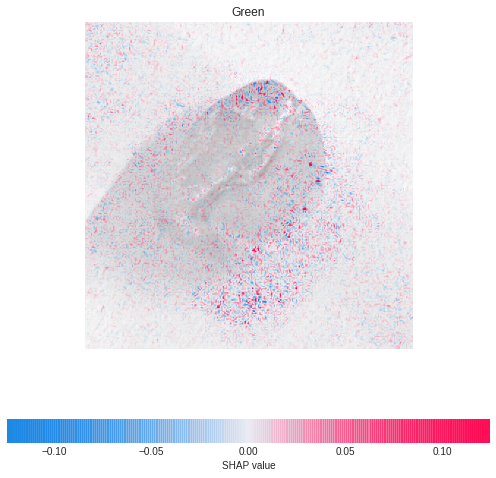